In this notebook, we will build a 3D map of a scene from a small set of images and then localize an image

In [2]:
%load_ext autoreload
%autoreload 2
import tqdm, tqdm.notebook, pycolmap
tqdm.tqdm = tqdm.notebook.tqdm  # notebook-friendly progress bars
from pathlib import Path

from hloc import extract_features, match_features, reconstruction, visualization, pairs_from_retrieval, localize_sfm
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Setup
Here we define some output paths.

In [19]:
images = Path('datasets/fastfive')
outputs = Path('outputs/fastfive')

sfm_pairs = outputs / 'pairs-sfm.txt'
# loc_pairs = outputs / 'pairs-loc.txt'
sfm_dir = outputs / 'sfm'
loc_pairs = outputs / 'pairs-loc.txt'
# features = outputs / 'features.h5'
# matches = outputs / 'matches.h5'

retrieval_conf = extract_features.confs['netvlad']
feature_conf = extract_features.confs['superpoint_aachen']
matcher_conf = match_features.confs['superglue']

# 3D mapping
First we list the images used for mapping. 

198 mapping images


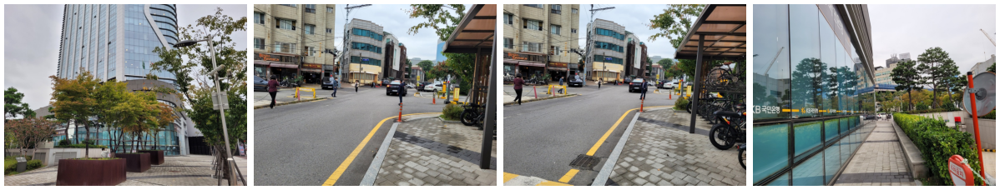

In [4]:
references = [p.relative_to(images).as_posix() for p in (images / 'mapping/').iterdir()]
print(len(references), "mapping images")
plot_images([read_image(images / r) for r in references[:4]], dpi=50)

Then we extract features and match them across image pairs.  
맵핑 이미지의 global feat은 NetVLAD로 추출,  
추출된 gfeat을 이용해 top 20 retrieved pair 를 만든다.  
맵핑과 쿼리 전체 이미지의 local feat은 superpoint로 추출,  
만들어진 pair와 superpoint feat를 superglue로 매칭한다. 

In [5]:
global_descriptors = extract_features.main(retrieval_conf, images, outputs, image_list=references)
pairs_from_retrieval.main(global_descriptors, sfm_pairs, num_matched=20)
feature_path = extract_features.main(feature_conf, images, outputs)
match_path = match_features.main(matcher_conf, sfm_pairs, feature_conf['output'], outputs)

[2022/10/11 14:35:50 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2022/10/11 14:35:50 hloc INFO] Skipping the extraction.
[2022/10/11 14:35:50 hloc INFO] Extracting image pairs from a retrieval database.
[2022/10/11 14:35:51 hloc INFO] Found 4140 pairs.
[2022/10/11 14:35:51 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}
[2022/10/11 14:35:51 hloc INFO] Found 207 images in root datasets/fastfive.
[2022/10/11 14:35:51 hloc INFO] Skipping the extraction.
[2022/10/11 14:35:51 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}
[2022/10/11 14:35:51 hloc IN

The we run incremental Structure-From-Motion and display the reconstructed 3D model.

In [6]:
if sfm_dir.exists(): 
    model = pycolmap.Reconstruction()
    model.read_binary(sfm_dir.as_posix())
else:
    model = reconstruction.main(sfm_dir, images, sfm_pairs, feature_path, match_path, image_list=references)

In [7]:
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping")
fig.show()

We also visualize which keypoints were triangulated into the 3D model.

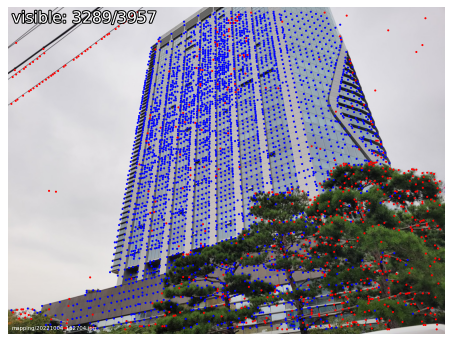

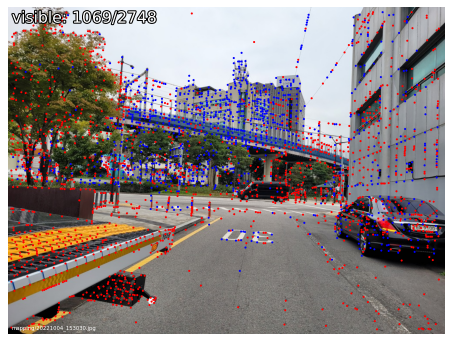

In [8]:
visualization.visualize_sfm_2d(model, images, color_by='visibility', n=2)

# Localization
Now that we have a 3D map of the scene, we can localize any image. 

9 query images


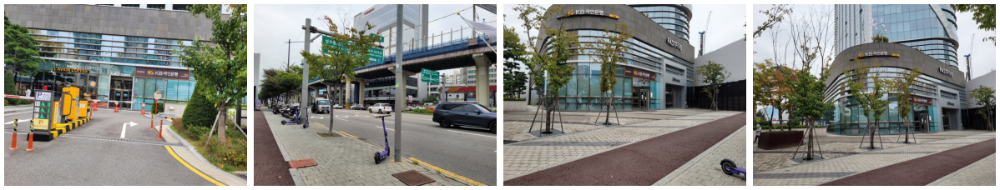

In [9]:
queries = [p.relative_to(images).as_posix() for p in (images / 'query/').iterdir()]
print(len(queries), "query images")
plot_images([read_image(images / r) for r in queries[:4]], dpi=50)

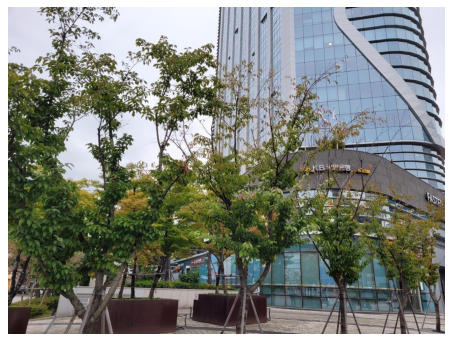

In [10]:
query = 'query/20221004_153053.jpg'
plot_images([read_image(images / query)], dpi=75)

Localization을 위한 pair의 path를 지정한다.

Again, we extract features for the query and match them using retrieval method.  
쿼리 이미지들을 대상으로 아까와 똑같이 global feature를 추출한다.  
추출된 gfeat을 이용해 query 이미지와 유사한 top 20 mapping 이미지를 retrival 해서 pair를 만든다. 


In [12]:
global_descriptors = extract_features.main(retrieval_conf, images, outputs, image_list=queries)
pairs_from_retrieval.main(global_descriptors, loc_pairs, num_matched=20, db_prefix="mapping", query_prefix="query")
match_features.main(matcher_conf, loc_pairs, features=feature_path, matches=match_path)

[2022/10/11 14:35:57 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2022/10/11 14:35:57 hloc INFO] Skipping the extraction.
[2022/10/11 14:35:57 hloc INFO] Extracting image pairs from a retrieval database.
[2022/10/11 14:35:57 hloc INFO] Found 180 pairs.
[2022/10/11 14:35:57 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}
[2022/10/11 14:35:57 hloc INFO] Skipping the matching.


PosixPath('outputs/fastfive/feats-superpoint-n4096-r1024_matches-superglue_pairs-sfm.h5')

In [13]:
# make query + intrinsic to text file
# format: "query_name camara_model params" each lines
camera_model = 'OPENCV' # w, h, fx, fy, cx, cy, k1, k2, p1, p2
params = [1008, 756, 765.171818, 765.171818, 504.000000, 378.000000, 0.062161, -0.047225, 0.003354, -0.002883]
with open(outputs / 'queries.txt', 'w') as f:
    for query in queries:
        f.write(f'{query} {camera_model} {" ".join(map(str, params))}\n')

In [14]:
results = outputs / 'queryresult.txt'  # the result file

localize_sfm.main(
    model, 
    outputs / 'queries.txt',
    loc_pairs,
    feature_path,
    match_path,
    results,
    covisibility_clustering=False
)

[2022/10/11 14:35:58 hloc.utils.parsers INFO] Imported 9 images from queries.txt
[2022/10/11 14:35:58 hloc INFO] Reading the 3D model...
[2022/10/11 14:35:58 hloc INFO] Starting localization...


  0%|          | 0/9 [00:00<?, ?it/s]

[2022/10/11 14:35:59 hloc INFO] Localized 9 / 9 images.
[2022/10/11 14:35:59 hloc INFO] Writing poses to outputs/fastfive/queryresult.txt...
[2022/10/11 14:35:59 hloc INFO] Writing logs to outputs/fastfive/queryresult.txt_logs.pkl...
[2022/10/11 14:35:59 hloc INFO] Done!


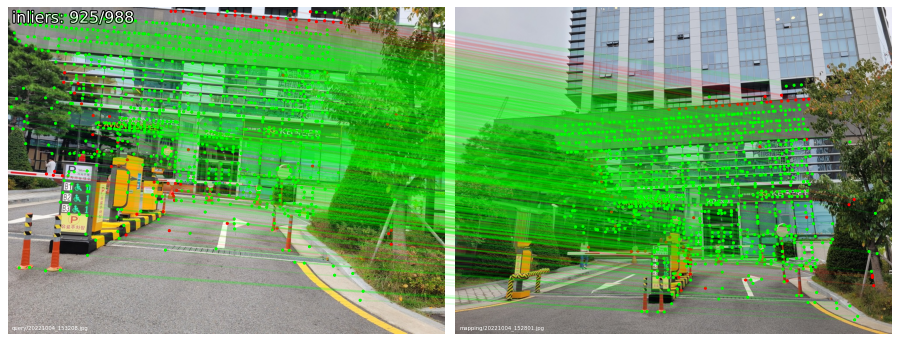

In [15]:
visualization.visualize_loc(results, images, model, n=1, top_k_db=1, prefix='query', seed=2)

In [16]:
import numpy as np

selected_query = 1  # start from 0
with open(results, 'r') as f:
    for i, line in enumerate(f):
        line = line.strip()
        if i == selected_query:
            qname, qvec, tvec = line.split(' ')[0], line.split(' ')[1:5], line.split(' ')[5:]
            break
# make qvec and tvec to numpy array
qvec = np.array(qvec, dtype=np.float32)
tvec = np.array(tvec, dtype=np.float32)
print(qname, qvec, tvec)

20221004_153050.jpg [ 0.9185783   0.23913808 -0.29464614  0.11050089] [-3.4029446  -0.07027746 -0.1521734 ]


In [17]:
import pycolmap

pose = pycolmap.Image(tvec=tvec, qvec=qvec)
camera = pycolmap.infer_camera_from_image(images / 'query' / qname)
viz_3d.plot_camera_colmap(fig, pose, camera, color='rgba(0,255,0,0.5)', name=query)
fig.show()

We read the EXIF data of the query to infer a rough initial estimate of camera parameters like the focal length. Then we estimate the absolute camera pose using PnP+RANSAC and refine the camera parameters.

In [28]:
# import pycolmap
# from hloc.localize_sfm import QueryLocalizer, pose_from_cluster

# camera = pycolmap.infer_camera_from_image(images / query)
# ref_ids = [model.find_image_with_name(r).image_id for r in references]
# conf = {
#     'estimation': {'ransac': {'max_error': 12}},
#     'refinement': {'refine_focal_length': True, 'refine_extra_params': True},
# }
# localizer = QueryLocalizer(model, conf)
# ret, log = pose_from_cluster(localizer, query, camera, ref_ids, feature_path, match_path)

# print(f'found {ret["num_inliers"]}/{len(ret["inliers"])} inlier correspondences.')
# visualization.visualize_loc_from_log(images, query, log, model)

We visualize the correspondences between the query images a few mapping images. We can also visualize the estimated camera pose in the 3D map.

In [29]:
from PIL import Image
from PIL.ExifTags import TAGS, GPSTAGS

# def decimal_coords(coords, ref):
#     decimal_degrees = coords[0] + coords[1] / 60 + coords[2] / 3600
#     if ref == "S" or ref == "W":
#         decimal_degrees = -decimal_degrees
#     return decimal_degrees

'''
extract time and gps from exif and save to file
format: "img_name yyyy:mm:dd hh:mm:ss lat lon alt

'''
def extract_img_data(img_path, output_path):
    with open(output_path, 'w') as f:
        for img in img_path.iterdir():
            img_name = img_path.name + '/' + img.name
            # img = Image.open(img)
            # exif = img._getexif()
            exif = Image.open(img)._getexif()
            if exif is None:
                f.write(f'{img_name} 0 0 0 0 0')
                continue
            # print(exif.items())
            # for tag, value in exif.items():
            #     name = TAGS.get(tag, tag)
            #     if name == "DateTimeOriginal":
            #         time = value
            #     if name == "GPSInfo":
            #         gps = value
            # for tag, value in gps.items():
            #     name = GPSTAGS.get(tag, tag)
            #     if name == "GPSLatitude":
            #         lat = decimal_coords(value, gps[1])
            #     if name == "GPSLongitude":
            #         lon = decimal_coords(value, gps[3])
            #     if name == "GPSAltitude":
            #         alt = value[0] / value[1]
            # print(time)
            # print(gps)
            # break
            # extract time
            time = exif[36867]
            print(time)
            gps = exif[34853]
            print(gps)
            print(gps[6])
            
            # lat = decimal_coords(gps[2], gps[1])
            # lon = decimal_coords(gps[4], gps[3])
            alt = gps[6]
            f.write(f'{img_name} {time} {lat} {lon} {alt}\n')
            break


data_path = Path('datasets/fastfive')
img_path = data_path / 'mapping'
img_data = data_path / 'image_data.txt'

extract_img_data(img_path, img_data)


2022:10:04 15:26:16
{1: 'N', 2: (37.0, 32.0, 55.77072), 3: 'E', 4: (127.0, 2.0, 39.27696), 5: 0, 6: 27.0}
27.0


NameError: name 'lat' is not defined

In [ ]:
from PIL import Image
from PIL.ExifTags import TAGS, GPSTAGS

def get_exif(filename):
    exif = Image.open(filename)._getexif()

    if exif is not None:
        for key, value in exif.items():
            name = TAGS.get(key, key)
            exif[name] = exif.pop(key)

        if 'GPSInfo' in exif:
            for key in exif['GPSInfo'].keys():
                name = GPSTAGS.get(key,key)
                exif['GPSInfo'][name] = exif['GPSInfo'].pop(key)

    return exif

exif = get_exif('datasets/fastfive/mapping/20221004_152252.jpg')

RuntimeError: dictionary keys changed during iteration